In [517]:
import pandas as pd
import numpy as np
import pyod as py
from pretty_confusion_matrix import pp_matrix_from_data
import plotly.express as px
import pickle

In [9]:
time = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-506/Timestamps.csv')

In [172]:
from pyod.models.pca import PCA

In [173]:
model=PCA(contamination=0.1)

In [348]:
filename = 'pca.sav'
pickle.dump(model, open(filename, 'wb'))

In [411]:
model = pickle.load(open(filename, 'rb'))

training on scenario 505 : abrupt & 20% leak

In [812]:
train = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-505/df_min.csv', parse_dates=['timestamp'], index_col='timestamp')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-505/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [813]:
train

,Unnamed: 0,Node 11,Link 21,Link 22,Pressure 10
timestamp,,,,,
2017-01-01 00:00:00,0,-1.207678,1.059229,0.234715,-0.216568
2017-01-01 00:30:00,1,-1.207678,1.059229,0.234715,-0.198513
2017-01-01 01:00:00,2,-1.692154,1.116585,0.010433,-0.178424
2017-01-01 01:30:00,3,-1.692154,1.116585,-0.213848,-0.159619
2017-01-01 02:00:00,4,-1.692154,1.116585,-0.213848,-0.140406
...,...,...,...,...,...
2017-12-31 21:30:00,17515,0.245750,0.543029,0.458996,0.559036
2017-12-31 22:00:00,17516,-0.238726,0.485673,0.234715,0.607036
2017-12-31 22:30:00,17517,-0.238726,0.485673,0.458996,0.640079


In [814]:
y_train = model.fit(train)

In [815]:
y_train = model.predict(train)

In [816]:
y_train

array([0, 0, 0, ..., 0, 0, 0])

In [817]:
Y=np.zeros(len(y_test))
Y

array([0., 0., 0., ..., 0., 0., 0.])

In [818]:
for i in range(48,len(y_train)):
    Y[i]= round(np.mean(y_train[i-48:i]))    
y_train=Y

In [819]:
y_train=pd.DataFrame(y_train)
y_train

,0
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
17515,0.0
17516,0.0
17517,0.0
17518,0.0


In [820]:
y_train.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_train

,timestamp,0
0,2017-01-01 00:00:00,0.0
1,2017-01-01 00:30:00,0.0
2,2017-01-01 01:00:00,0.0
3,2017-01-01 01:30:00,0.0
4,2017-01-01 02:00:00,0.0
...,...,...
17515,2017-12-31 21:30:00,0.0
17516,2017-12-31 22:00:00,0.0
17517,2017-12-31 22:30:00,0.0
17518,2017-12-31 23:00:00,0.0


In [821]:
y_train.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-505/pred_data.csv')
y_train = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-505/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [822]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [823]:
fig = px.line(y_train.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

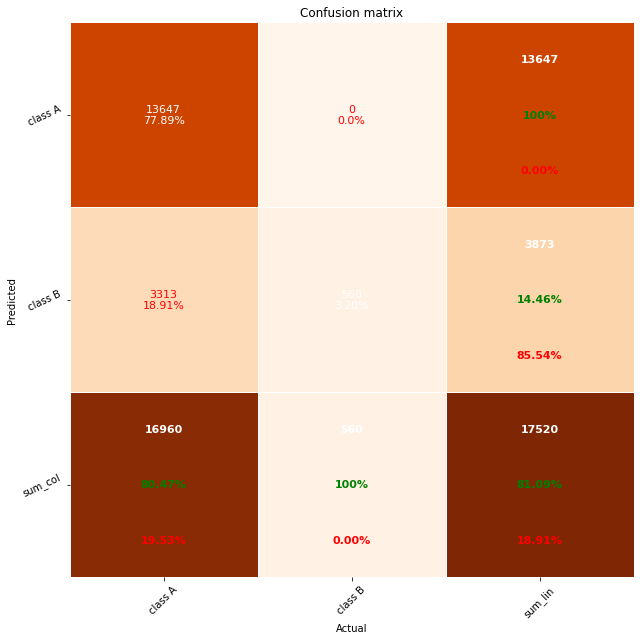

In [824]:
pp_matrix_from_data(y_train['0'],y['Label'])

test on scenario 2 : incipient & 5% leak

In [726]:
x = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-2/df_min.csv',parse_dates=['timestamp'], index_col='timestamp')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-2/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [727]:
y.describe()

,Unnamed: 0,Index,Label
count,17520.000000,17520.000000,17520.000000
mean,8759.500000,8760.500000,0.051712
std,5057.732694,5057.732694,0.221452
min,0.000000,1.000000,0.000000
25%,4379.750000,4380.750000,0.000000
50%,8759.500000,8760.500000,0.000000
75%,13139.250000,13140.250000,0.000000
max,17519.000000,17520.000000,1.000000


In [728]:
y_test = model.predict(x)

In [729]:
y_test

array([1, 1, 1, ..., 0, 0, 0])

In [ ]:
y_pred=np.zeros(len(y_test))
y_pred

In [730]:
for i in range(48,len(y_test)):
    y_pred[i]= round(np.mean(y_test[i-48:i]))    
y_test=y_pred

In [731]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
17515,0.0
17516,0.0
17517,0.0
17518,0.0


In [732]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,0.0
1,2017-01-01 00:30:00,0.0
2,2017-01-01 01:00:00,0.0
3,2017-01-01 01:30:00,0.0
4,2017-01-01 02:00:00,0.0
...,...,...
17515,2017-12-31 21:30:00,0.0
17516,2017-12-31 22:00:00,0.0
17517,2017-12-31 22:30:00,0.0
17518,2017-12-31 23:00:00,0.0


In [733]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-2/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-2/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [734]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [735]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

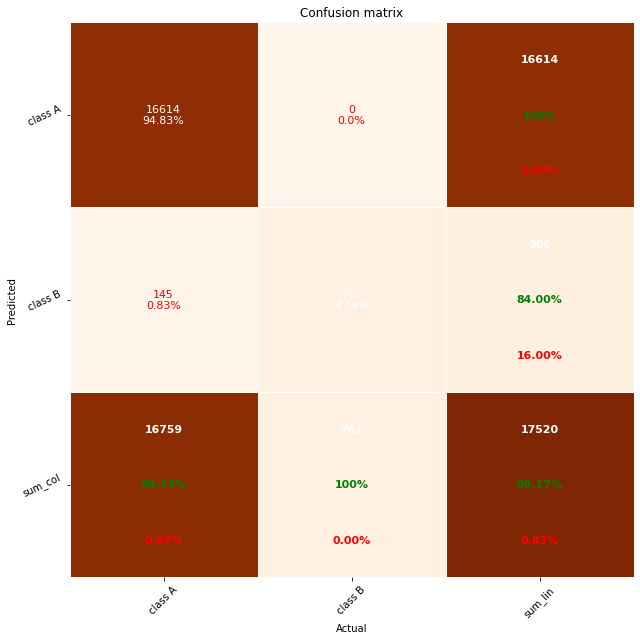

In [739]:
pp_matrix_from_data(y_test['0'],y['Label'])

test on scenario 5 : abrupt & 5%

In [740]:
x = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-5/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-5/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [741]:
y.describe()

,Unnamed: 0,Index,Label
count,17520.000000,17520.000000,17520.000000
mean,8759.500000,8760.500000,0.053653
std,5057.732694,5057.732694,0.225338
min,0.000000,1.000000,0.000000
25%,4379.750000,4380.750000,0.000000
50%,8759.500000,8760.500000,0.000000
75%,13139.250000,13140.250000,0.000000
max,17519.000000,17520.000000,1.000000


In [742]:
y_test = model.predict(x)

In [743]:
y_test

array([1, 1, 1, ..., 0, 0, 0])

In [744]:
y_pred=np.zeros(len(y_test))
y_pred

array([0., 0., 0., ..., 0., 0., 0.])

In [745]:
for i in range(48,len(y_test)):
    y_pred[i]= round(np.mean(y_test[i-48:i]))    
y_test=y_pred

In [746]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
17515,0.0
17516,0.0
17517,0.0
17518,0.0


In [747]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,0.0
1,2017-01-01 00:30:00,0.0
2,2017-01-01 01:00:00,0.0
3,2017-01-01 01:30:00,0.0
4,2017-01-01 02:00:00,0.0
...,...,...
17515,2017-12-31 21:30:00,0.0
17516,2017-12-31 22:00:00,0.0
17517,2017-12-31 22:30:00,0.0
17518,2017-12-31 23:00:00,0.0


In [748]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-5/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-5/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [749]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [751]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

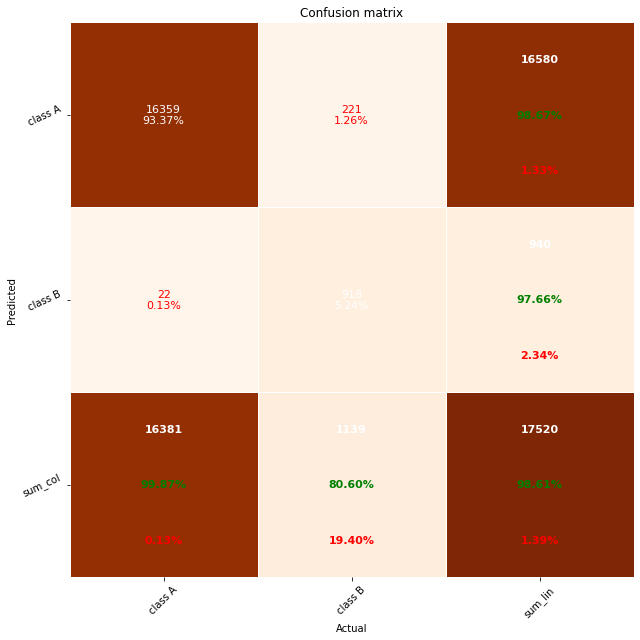

In [753]:
pp_matrix_from_data(y_test['0'],y['Label'])

test on scenario 4 : no leak

In [754]:
x_4 = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-4/df_min.csv')
y = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-4/y.csv', parse_dates=['timestamp'], index_col='timestamp')

In [755]:
y_test = model.predict(x_4)

In [756]:
y_test

array([1, 1, 1, ..., 0, 0, 0])

In [757]:
for i in range(48,len(y_test)):
    y_pred[i]= round(np.mean(y_test[i-48:i]) )   
y_test=y_pred

In [758]:
y_test=pd.DataFrame(y_test)
y_test

,0
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
17515,0.0
17516,0.0
17517,0.0
17518,0.0


In [759]:
y_test.insert(0,"timestamp" , pd.to_datetime(time['Timestamp']))
y_test

,timestamp,0
0,2017-01-01 00:00:00,0.0
1,2017-01-01 00:30:00,0.0
2,2017-01-01 01:00:00,0.0
3,2017-01-01 01:30:00,0.0
4,2017-01-01 02:00:00,0.0
...,...,...
17515,2017-12-31 21:30:00,0.0
17516,2017-12-31 22:00:00,0.0
17517,2017-12-31 22:30:00,0.0
17518,2017-12-31 23:00:00,0.0


In [760]:
y_test.to_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-4/pred_data.csv')
y_test = pd.read_csv('C:/Users/cjoly/projet/Net1_CMH/Scenario-4/pred_data.csv', parse_dates=['timestamp'], index_col='timestamp')

In [761]:
fig = px.line(y.reset_index(), x='timestamp', y='Label', title='Anomaly réel')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [762]:
fig = px.line(y_test.reset_index(), x='timestamp', y='0', title='Anomaly prédites')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

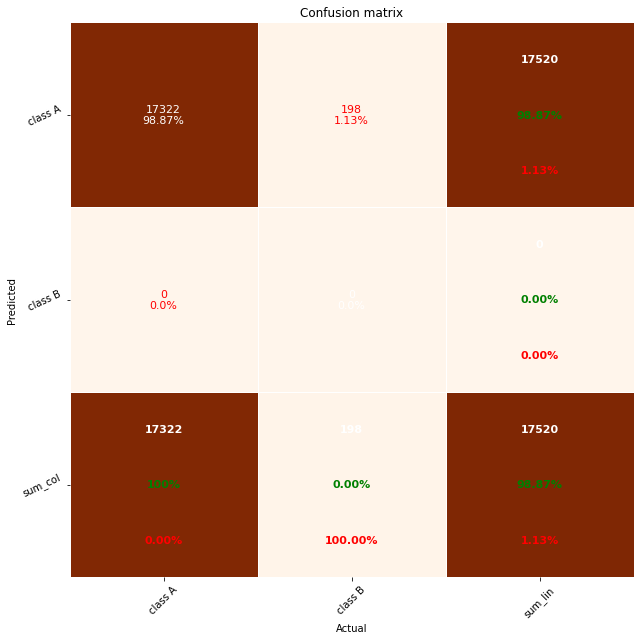

In [763]:
pp_matrix_from_data(y_test['0'],y['Label'])